In [1]:
!pip install einops timm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 12.3 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
from unittest.mock import patch

from PIL import Image
from transformers import AutoProcessor, AutoModelForCausalLM
from transformers.dynamic_module_utils import get_imports

def fixed_get_imports(filename):
    """Work around for https://huggingface.co/microsoft/phi-1_5/discussions/72."""
    if not str(filename).endswith("/modeling_florence2.py"):
        return get_imports(filename)
    imports = get_imports(filename)
    imports.remove("flash_attn")
    return imports

with patch("transformers.dynamic_module_utils.get_imports", fixed_get_imports):
    model = AutoModelForCausalLM.from_pretrained("microsoft/Florence-2-large", trust_remote_code=True)
    processor = AutoProcessor.from_pretrained("microsoft/Florence-2-large", trust_remote_code=True)



/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/2.44k [00:00<?, ?B/s]

configuration_florence2.py:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_florence2.py:   0%|          | 0.00/127k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- modeling_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


pytorch_model.bin:   0%|          | 0.00/1.54G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/51.0 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-large:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

In [4]:
prompt = "<OD>"

#url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/car.jpg?download=true"

#image = Image.open('cvplayground/imgs/car.jpg')
image = Image.open('drive/MyDrive/pictures/IMG_20200525_190012.jpg').transpose(Image.ROTATE_270)

inputs = processor(text=prompt, images=image, return_tensors="pt")
generated_ids = model.generate(
    input_ids=inputs["input_ids"],
    pixel_values=inputs["pixel_values"],
    max_new_tokens=1024,
    num_beams=3,
    do_sample=False
)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

parsed_answer = processor.post_process_generation(generated_text, task=prompt, image_size=(image.width, image.height))

print(parsed_answer)

{'<OD>': {'bboxes': [[1270.5, 3474.0, 1816.5, 3862.0], [1264.5, 3518.0, 1546.5, 3862.0], [1510.5, 3474.0, 1825.5, 3766.0], [772.5, 3522.0, 1039.5, 3870.0], [1045.5, 3406.0, 1279.5, 3734.0], [502.5, 666.0, 1804.5, 3862.0], [1222.5, 874.0, 1600.5, 1282.0], [1384.5, 1770.0, 1711.5, 2062.0], [502.5, 2050.0, 1375.5, 3146.0], [1252.5, 1454.0, 2008.5, 3858.0], [1270.5, 3518.0, 1534.5, 3854.0], [1516.5, 3474.0, 1819.5, 3754.0], [790.5, 3530.0, 1030.5, 3870.0], [1057.5, 3414.0, 1270.5, 3726.0], [1270.5, 2838.0, 1843.5, 3622.0]], 'labels': ['footwear', 'footwear', 'footwear', 'footwear', 'footwear', 'girl', 'human face', 'human face', 'miniskirt', 'person', 'sneakers', 'sneakers', 'sneakers', 'sneakers', 'trousers']}}


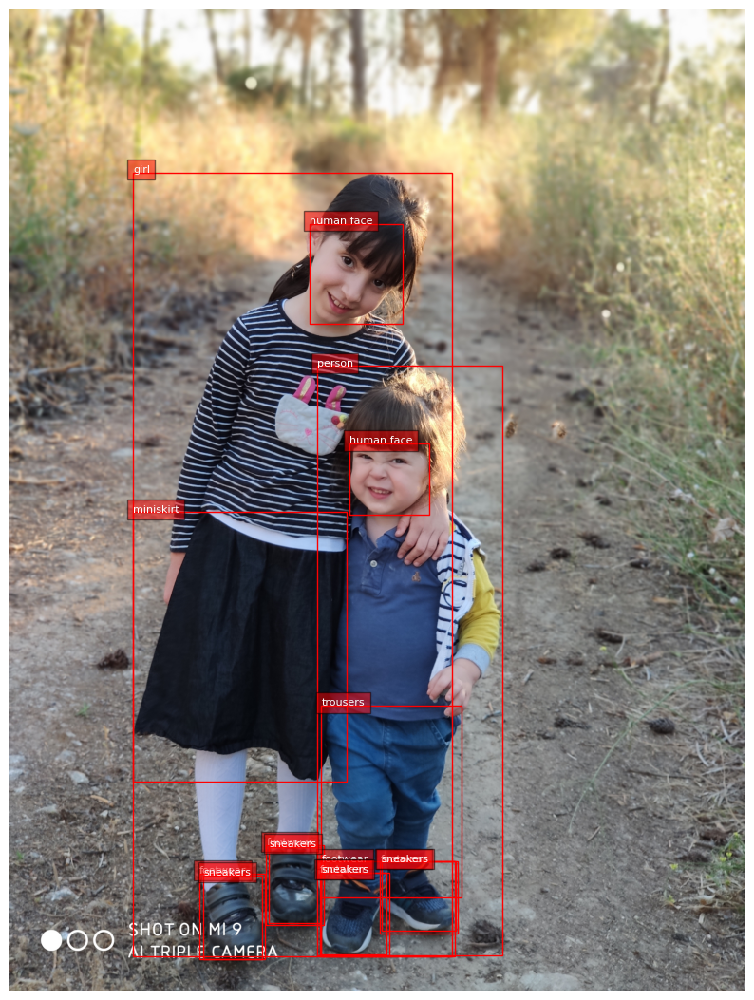

In [5]:
import matplotlib.pyplot as plt
from PIL import ImageDraw
import matplotlib.patches as patches
from textwrap import wrap
import os
import glob

def plot_bbox(image, data):
   # Create a figure and axes
    fig, ax = plt.subplots(figsize=(10, 15))

    # Display the image
    ax.imshow(image)

    # Plot each bounding box
    for bbox, label in zip(data['bboxes'], data['labels']):
        # Unpack the bounding box coordinates
        x1, y1, x2, y2 = bbox
        # Create a Rectangle patch
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none')
        # Add the rectangle to the Axes
        ax.add_patch(rect)
        # Annotate the label
        plt.text(x1, y1, label, color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))

    # Remove the axis ticks and labels
    ax.axis('off')

    # Show the plot
    plt.show()

# Display the image with bounding boxes and predictions
plot_bbox(image, parsed_answer[prompt])


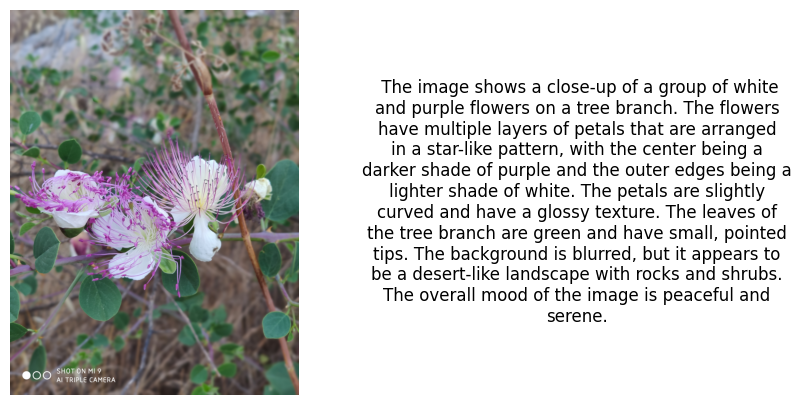

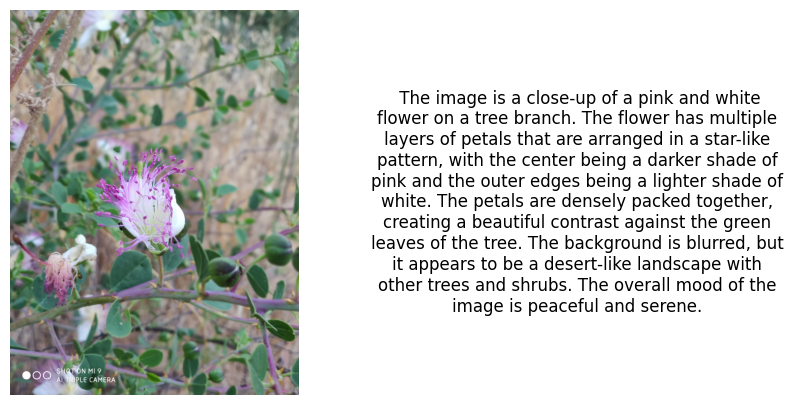

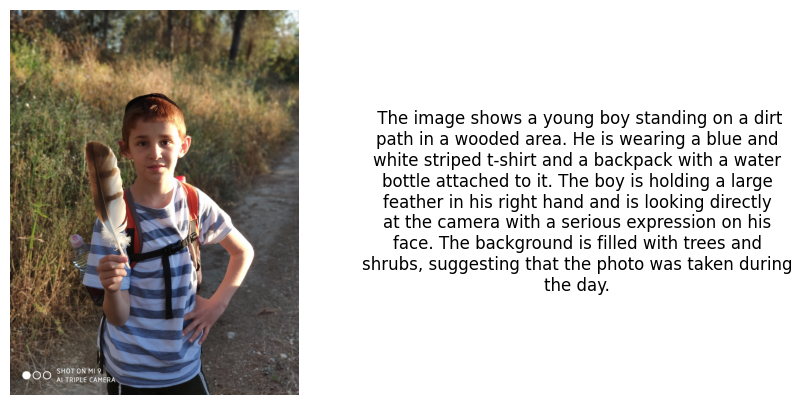

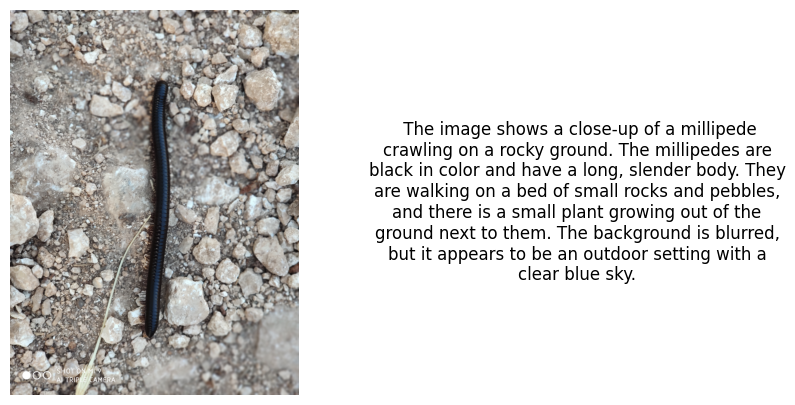

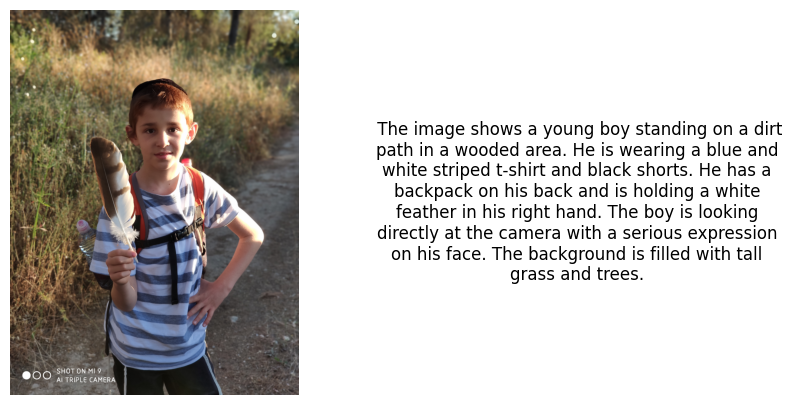

...

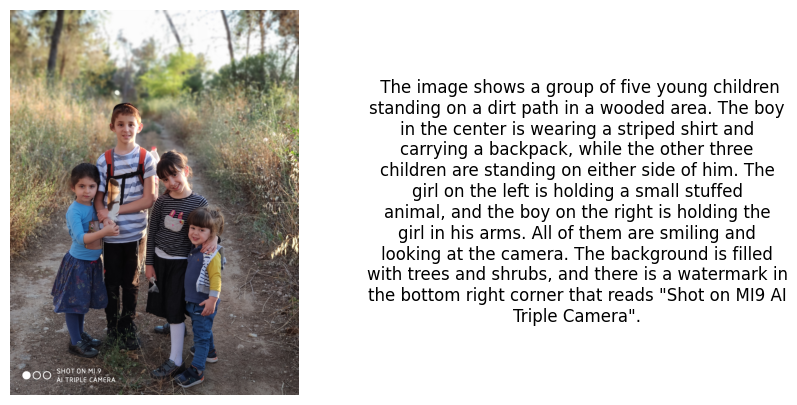

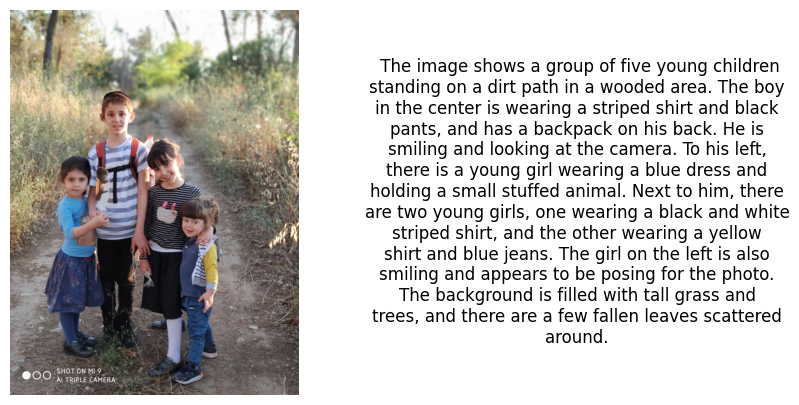

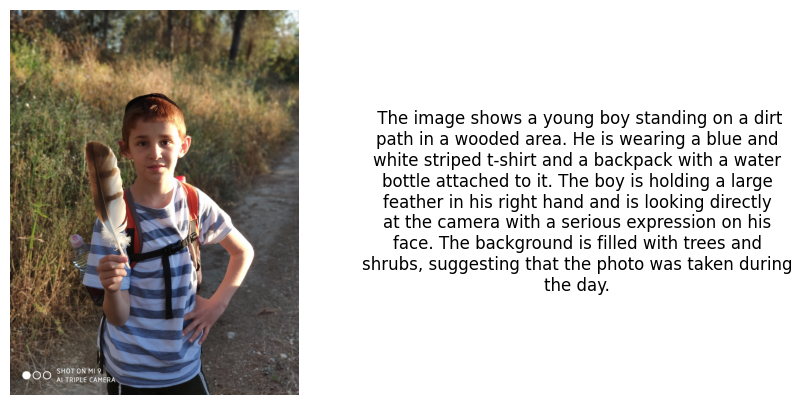

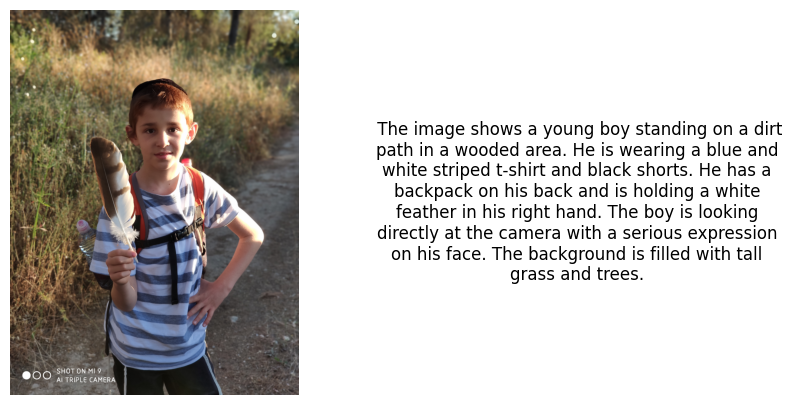

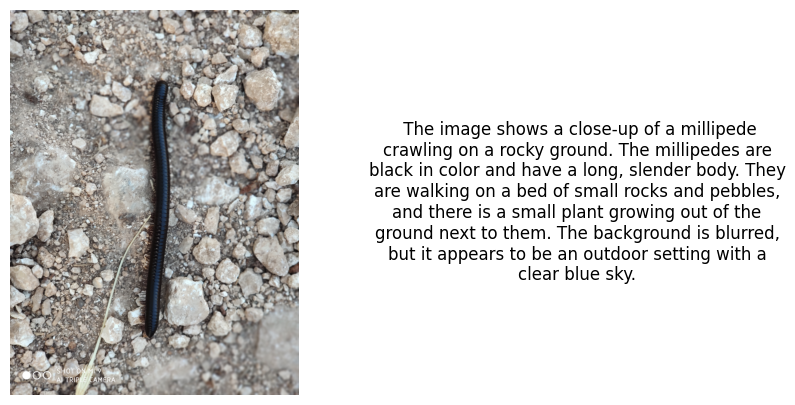

In [6]:
def display_image_and_text(image, text):
    # Create a figure with 1 row and 2 columns
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    # Display the image in the first pane
    axs[0].imshow(image)
    axs[0].axis('off')  # Hide the axis on the image pane

    # Display the text in the second pane
    wrapped_description = '\n'.join(wrap(text, 50))
    axs[1].text(0.5, 0.5, wrapped_description, ha='center', va='center', fontsize=12)
    axs[1].axis('off')  # Hide the axis on the text pane

    plt.show()

prompt = '<MORE_DETAILED_CAPTION>'
image_list = glob.glob('drive/MyDrive/pictures' + "/*.jpg")

def display_image(img, desc):
    wrapped_description = '\n'.join(wrap(parsed_answer[prompt], 50))
    plt.imshow(image)
    plt.title(wrapped_description)
    plt.show()

for image_path in image_list:
    image = Image.open(image_path).transpose(Image.ROTATE_270)

    inputs = processor(text=prompt, images=image, return_tensors="pt")
    generated_ids = model.generate(
        input_ids=inputs["input_ids"],
        pixel_values=inputs["pixel_values"],
        max_new_tokens=1024,
        num_beams=3,
        do_sample=False
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    parsed_answer = processor.post_process_generation(generated_text, task=prompt, image_size=(image.width, image.height))
    display_image_and_text(image, parsed_answer[prompt])


Explanation: Setup:
Install the OpenAI library. Import the library and set up your API key. Function:
translate_text function constructs a prompt asking ChatGPT to translate the provided text. The function calls openai.Completion.create() to get the translation. The max_tokens parameter controls the length of the output, and temperature controls the randomness of the output. Usage:
You can use the translate_text function to translate any text from English to Russian. Notes: API Key: Ensure that your API key is kept secure and not exposed in public repositories. Engine: The text-davinci-003 engine is used in this example. You can use other engines like gpt-3.5-turbo or gpt-4 if available and suitable for your task. Cost: Using the OpenAI API incurs costs. Check the pricing details on the OpenAI website.

In [2]:
!pip install openai==0.28.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.5/76.5 kB 2.9 MB/s eta 0:00:00


In [4]:
import openai

# Set your OpenAI API key
from google.colab import userdata
openai.api_key = userdata.get('open_key')

def translate_text(text, source_language='English', target_language='Russian'):
    prompt = (
        f"Translate the following text from {source_language} to {target_language}:\n\n"
        f"{text}\n\n"
        f"Translation:"
    )

    response = openai.ChatCompletion.create(
        model="gpt-3.5-turbo",
        messages=[
            {"role": "system", "content": "You are a helpful assistant that translates text."},
            {"role": "user", "content": prompt}
        ],
        max_tokens=1024,
        temperature=0.3
    )

    translation = response['choices'][0]['message']['content'].strip()
    return translation

# Example usage
text_to_translate = "Hello, how are you?"
translated_text = translate_text(text_to_translate)
print(f"Translated text: {translated_text}")


Translated text: Привет, как дела?
